In [32]:
from ultralytics import YOLO

# Load the trained model (adjust path if needed)
model = YOLO("models/v1.1_stingless_bee_best.pt")


In [38]:
results = model.predict(
    source="datasets/v1/images/val",  # or a single image path
    save=True,
    imgsz=640,
    conf=0.15  # confidence threshold
)



image 1/2 /app/Project_Create_Model/Example1/datasets/v1/images/val/0e606f85-DSC03209.JPG: 448x640 40 stingless_bees, 326.2ms
image 2/2 /app/Project_Create_Model/Example1/datasets/v1/images/val/e1a8253b-DSC03222.JPG: 448x640 78 stingless_bees, 291.7ms
Speed: 5.5ms preprocess, 309.0ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict7


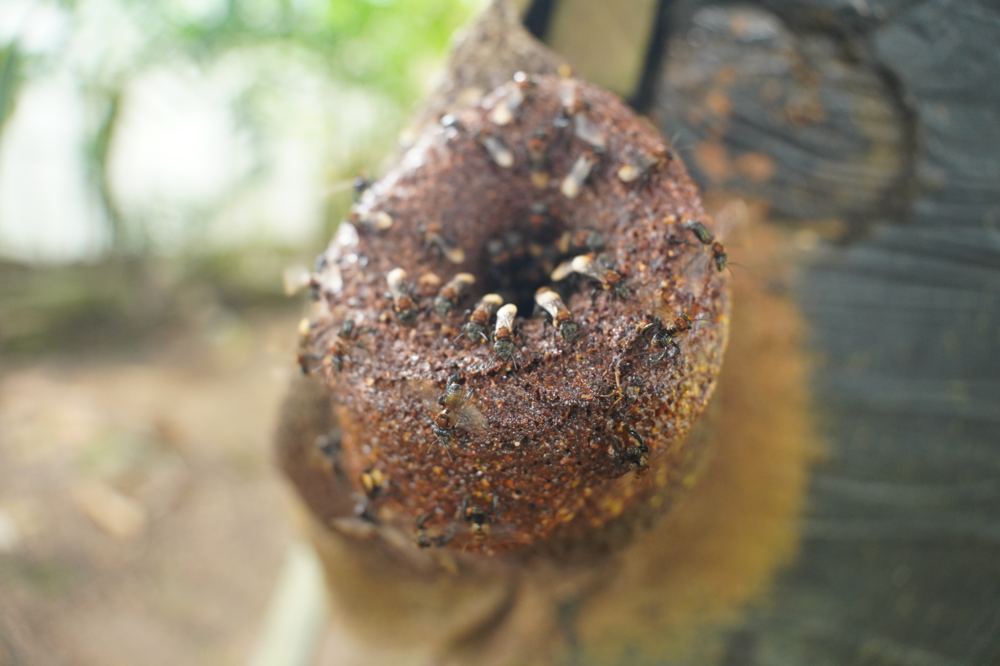

In [39]:
from IPython.display import Image, display
import os

pred_dir = "runs/detect/predict"
pred_images = [f for f in os.listdir(pred_dir) if f.endswith(".jpg")]

# Show first result image
display(Image(filename=os.path.join(pred_dir, pred_images[0])))


In [45]:
for result in results:
    print(f"{result.path}: {len(result.boxes)} bees detected")

/app/Project_Create_Model/Example1/datasets/v1/images/val/0e606f85-DSC03209.JPG: 40 bees detected
/app/Project_Create_Model/Example1/datasets/v1/images/val/e1a8253b-DSC03222.JPG: 78 bees detected


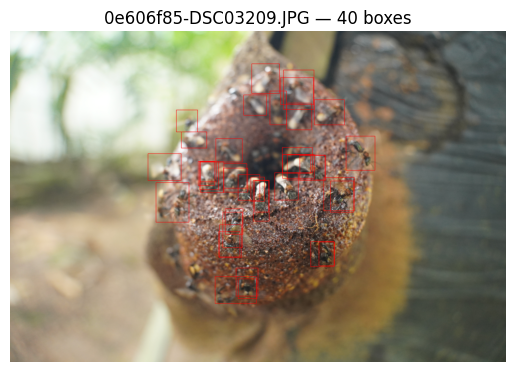

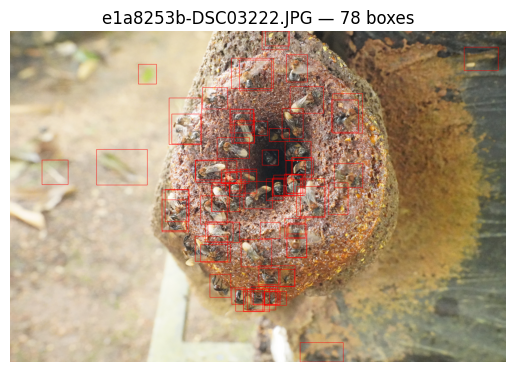

In [47]:
import cv2
import matplotlib.pyplot as plt

for result in results:
    # Load the original image
    img = cv2.imread(result.path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Draw each bounding box (no label)
    for box in result.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
        cv2.rectangle(img, (x1, y1), (x2, y2), color=(255, 0, 0), thickness=4)

    # Show image
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"{os.path.basename(result.path)} — {len(result.boxes)} boxes")
    plt.show()


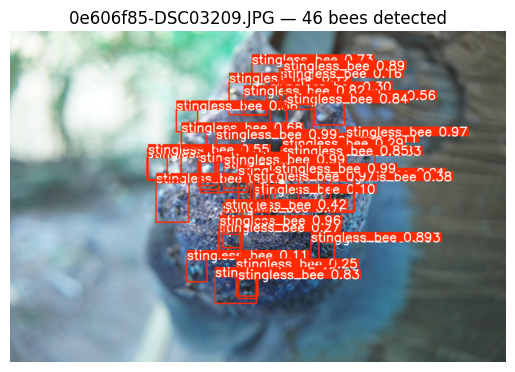

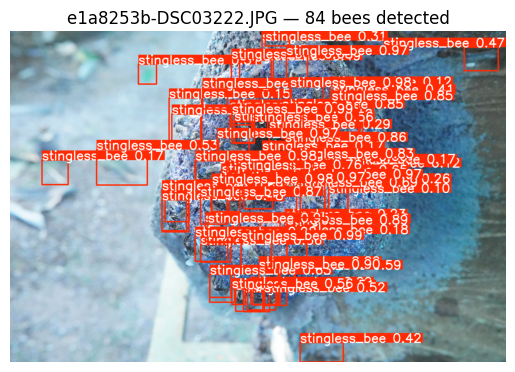

In [37]:
import matplotlib.pyplot as plt

# Show all images with predicted boxes
for result in results:
    img = result.plot()  # returns image array (with boxes drawn)
    plt.imshow(img)
    plt.title(f"{os.path.basename(result.path)} — {len(result.boxes)} bees detected")
    plt.axis('off')
    plt.show()


In [26]:
for result in results:
    print(f"{result.path}:")
    for box in result.boxes:
        cls_id = int(box.cls[0])
        conf = float(box.conf[0])
        xyxy = box.xyxy[0].tolist()
        print(f"  - Bee detected at {xyxy} with confidence {conf:.2f}")


/app/Project_Create_Model/Example1/datasets/v1/images/val/0e606f85-DSC03209.JPG:
  - Bee detected at [3202.015625, 1712.19287109375, 3487.12109375, 2043.46923828125] with confidence 0.99
  - Bee detected at [2587.64453125, 1602.441162109375, 2865.5625, 1899.9755859375] with confidence 0.99
  - Bee detected at [2490.2744140625, 1300.4434814453125, 2810.28955078125, 1583.9857177734375] with confidence 0.99
  - Bee detected at [2943.110107421875, 1803.712158203125, 3135.32470703125, 2297.277587890625] with confidence 0.97
  - Bee detected at [2759.690673828125, 1736.87548828125, 3022.75146484375, 2045.5191650390625] with confidence 0.97
  - Bee detected at [4065.163818359375, 1270.29443359375, 4415.830078125, 1683.0633544921875] with confidence 0.97
  - Bee detected at [2534.218017578125, 2341.59326171875, 2802.70556640625, 2739.39794921875] with confidence 0.96
  - Bee detected at [3638.24853515625, 2544.407470703125, 3920.44970703125, 2848.485107421875] with confidence 0.89
  - Bee dete

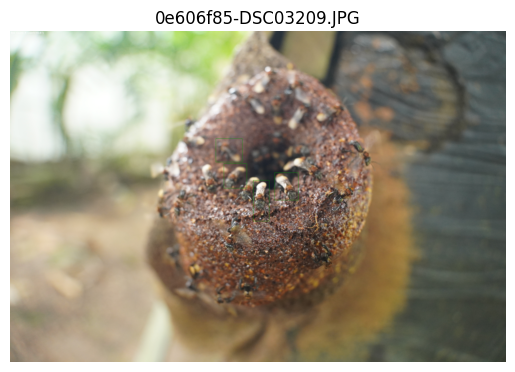

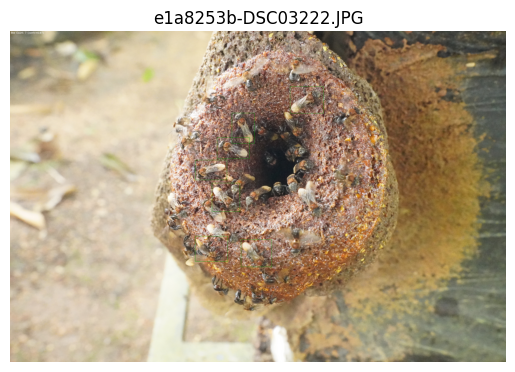

0e606f85-DSC03209.JPG: 10 bees detected (confidence ≥ 0.85)
e1a8253b-DSC03222.JPG: 16 bees detected (confidence ≥ 0.85)


In [48]:
import cv2
import matplotlib.pyplot as plt

CONF_THRESHOLD = 0.97  # set your confidence cutoff

for result in results:
    # Load image
    img = cv2.imread(result.path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    bee_count = 0  # initialize count for this image

    for box in result.boxes:
        conf = float(box.conf[0])
        if conf >= CONF_THRESHOLD:
            x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            bee_count += 1

    # Draw label of count (top-left corner)
    cv2.putText(
        img,
        f"Bee Count: {bee_count} (conf>={CONF_THRESHOLD})",
        (10, 30),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.9,
        (255, 255, 255),
        2
    )

    # Show image
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"{os.path.basename(result.path)}")
    plt.show()


threshold = 0.85

for result in results:
    image_name = os.path.basename(result.path)
    
    # Filter boxes with conf >= 0.97
    high_conf_boxes = [box for box in result.boxes if float(box.conf[0]) >= threshold]
    count = len(high_conf_boxes)
    
    print(f"{image_name}: {count} bees detected (confidence ≥ {threshold})")

